In [45]:
import os
import sys
import urllib, io
os.getcwd()
sys.path.append("..")
sys.path.append("../utils")
proj_dir = os.path.abspath('../..')

## add helpers to python path
if os.path.join(proj_dir,'stimuli') not in sys.path:
    sys.path.append(os.path.join(proj_dir,'stimuli'))

import numpy as np
import scipy.stats as stats
import pandas as pd
from scipy import stats
from scipy.spatial import distance
from scipy import ndimage
from scipy.stats import entropy
from random import random
from sklearn.cluster import SpectralBiclustering
import sklearn.metrics as metrics
import itertools

import pymongo as pm
from collections import Counter
import json
import re
import ast

from PIL import Image, ImageOps, ImageDraw, ImageFont 

from io import BytesIO
import base64

import  matplotlib
from matplotlib import pylab, mlab, pyplot
%matplotlib inline
from IPython.core.pylabtools import figsize, getfigs
plt = pyplot
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
from matplotlib import colors

import seaborn as sns
sns.set_context('talk')
sns.set_style('darkgrid')

from IPython.display import clear_output

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")

import plotly
import plotly.graph_objects as go
import plotly.io as pio
pio.orca.config.use_xvfb = False
plotly.io.orca.config.save()

import importlib
import trajectory as g

In [2]:
## directory & file hierarchy
proj_dir = os.path.abspath('../..')
datavol_dir = os.path.join(proj_dir,'data')
analysis_dir = os.path.abspath(os.path.join(os.getcwd(),'..'))
results_dir = os.path.join(analysis_dir,'results')
stim_dir = os.path.join(proj_dir,'stimuli')
plot_dir = os.path.join(results_dir,'plots')
csv_dir = os.path.join(results_dir,'csv')
json_dir = os.path.join(results_dir,'json')
exp_dir = os.path.abspath(os.path.join(proj_dir,'experiments'))
png_dir = os.path.abspath(os.path.join(datavol_dir,'png'))
jefan_dir = os.path.join(analysis_dir,'jefan')
will_dir = os.path.join(analysis_dir,'will')
    
if not os.path.exists(results_dir):
    os.makedirs(results_dir)
    
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)   
    
if not os.path.exists(csv_dir):
    os.makedirs(csv_dir)       

### load in data

In [3]:
iteration_name = 'Exp2Pilot3_all'
num_trials = 24 #for sanity checks

In [4]:
# Data already compiled into dataframes in CogSci 2020 Dataframe Generator

# trial_end data
trial_path = os.path.join(csv_dir,'block_silhouette_{}_good.csv'.format(iteration_name))
df = pd.read_csv(trial_path)

# # initial_block data
initial_path = os.path.join(csv_dir,'block_silhouette_initial_{}_good.csv'.format(iteration_name))
dfi = pd.read_csv(initial_path)

# # settled_block data
settled_path = os.path.join(csv_dir,'block_silhouette_settled_{}_good.csv'.format(iteration_name))
dfs = pd.read_csv(settled_path)

# # Sanity Check- same participants in each dataset.
df_participants = df.gameID.unique()
dfs_participants = dfs.gameID.unique()
assert Counter(df_participants) == Counter(dfs_participants)

n_before_outliers = len(df_participants)
print(str(n_before_outliers) + ' participants total')

105 participants total


### apply preprocessing

In [5]:
targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())

dfi['usableDiscreteWorld'] = dfi['discreteWorld'].apply(lambda a: 1+(-1)*np.array(ast.literal_eval(a)))
dfi['flatDiscreteWorld'] = dfi['discreteWorld'].apply(lambda a: (1+(-1)*np.array(ast.literal_eval(a))).flatten())

dfic = dfi.copy()
#dfic = dfi[dfi.condition=='repeated']
dfic = dfic[['targetName','gameID','blockNum','repetition','phase_extended','flatDiscreteWorld','usableDiscreteWorld','rawF1DiscreteScore']]
dfic['discreteWorld'] = dfic['usableDiscreteWorld']
dfic['flatDiscreteWorldStr'] = dfic['flatDiscreteWorld'].apply(g.convert_to_str)

max_actions = dfic['blockNum'].max()

In [6]:
dfic

,targetName,gameID,blockNum,repetition,phase_extended,flatDiscreteWorld,usableDiscreteWorld,rawF1DiscreteScore,discreteWorld,flatDiscreteWorldStr
0,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,1,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.266667,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
1,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,2,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.470588,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
2,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,3,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.555556,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
3,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,4,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.700000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
4,hand_selected_011,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,5,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.772727,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
5,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,1,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.266667,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
6,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,2,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.375000,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
7,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,3,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.424242,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
8,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,4,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.470588,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...
9,hand_selected_006,0050-6c4598b0-4ba2-453b-9450-a2b56232ac90,5,0,pre,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0.514286,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0], [0, ...",0000000000000000000000000000000000000000000000...


### make trajectory graph

In [34]:
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = ['pre', 'post']
    for this_target in targets:
        for this_phase in phases:
            g.plot_trajectory_graph(data = dfic, 
                                    target_name = this_target, 
                                    phase = this_phase, 
                                    save = False, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.4,
                                    node_size_scale_factor = 0.4)

../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/Users/will/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



In [ ]:
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = ['pre', 'post']
    for this_target in targets[2:3]:
        for this_phase in phases:
            g.plot_trajectory_graph(data = dfic, 
                                    target_name = this_target, 
                                    phase = this_phase, 
                                    save = True, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.5,
                                    node_size_scale_factor = 0.5)

### analyze sparsity over world states

In [187]:
importlib.reload(g)
H = dict()
P = dict()
W = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    W[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p,w = g.get_sparsity_over_states(data=dfic, target=target, phase=phase, metric='mean')
        H[target][phase] = h
        P[target][phase] = p
        W[target][phase] = w
        clear_output(wait=True)
print('Done!')

Done!


In [141]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in state visits in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean state visits in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in state visits in each phase**
Original mean = 0.39394. Bootstrapped mean = 0.38947.
95% CI = [0.22909, 0.55502].
p<0=0.0 | p>0=2.0.
t(7) = 4.2279 | p = 0.0039
-------
**Mean state visits in each phase**
pre
Original mean = 2.04344. Bootstrapped mean = 2.04415.
95% CI = [1.87586, 2.2075].
post
Original mean = 2.43738. Bootstrapped mean = 2.43362.
95% CI = [2.17349, 2.6703].


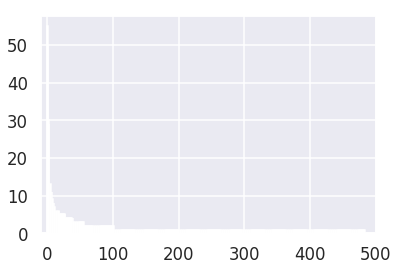

In [213]:
a = list(W[targets[0]]['pre'].values())
a.sort()
a.reverse()
f = plt.figure()
plt.bar(height=a,x=range(len(a)),color='black')
plt.xlim((-10,500))
plt.show()

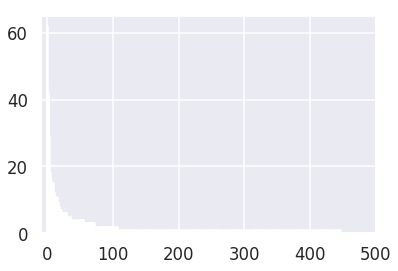

In [204]:
a = list(W[targets[0]]['post'].values())
a.sort()
a.reverse()
f = plt.figure()
plt.bar(height=a,x=range(len(a)), color='blue')
plt.xlim((-10,500))
plt.show()

### Analyze set relationships between pre states and post states

In [44]:
NS = dict() # num states dict
for target in targets:
    NS[target] = dict()
    PRE = set(P[target]['pre'].keys())
    POST = set(P[target]['post'].keys())
    xsect = PRE.intersection(POST)
    u = PRE.union(POST)
    overlap = list(xsect)
    post_prop = np.sum([P[target]['post'][o] for o in overlap])
    pre_prop = np.sum([P[target]['pre'][o] for o in overlap])    
    NS[target]['pre'] = len(PRE)
    NS[target]['post'] = len(POST)
    NS[target]['xsect'] = len(xsect)
    NS[target]['union'] = len(u)
    NS[target]['pre_overlap'] = pre_prop
    NS[target]['post_overlap'] = post_prop   
    NS[target]['diff'] = len(POST) - len(PRE)
    print('{} | Pre: {} | Post: {} | Intrsct: {} | Union: {} | PreOverlap: {} | PostOverlap: {}'.
          format(target, len(PRE),len(POST),len(xsect), len(u), pre_prop.round(4),post_prop.round(4)))

## create num states dataframe 
ND = pd.DataFrame.from_dict(NS, orient='index').reset_index()    

hand_selected_004 | Pre: 484 | Post: 448 | Intrsct: 134 | Union: 798 | PreOverlap: 0.5756 | PostOverlap: 0.6641
hand_selected_005 | Pre: 324 | Post: 332 | Intrsct: 92 | Union: 564 | PreOverlap: 0.6697 | PostOverlap: 0.7027
hand_selected_006 | Pre: 426 | Post: 479 | Intrsct: 110 | Union: 795 | PreOverlap: 0.545 | PostOverlap: 0.5443
hand_selected_008 | Pre: 423 | Post: 363 | Intrsct: 96 | Union: 690 | PreOverlap: 0.5681 | PostOverlap: 0.7021
hand_selected_009 | Pre: 442 | Post: 359 | Intrsct: 114 | Union: 687 | PreOverlap: 0.6225 | PostOverlap: 0.7401
hand_selected_011 | Pre: 383 | Post: 393 | Intrsct: 102 | Union: 674 | PreOverlap: 0.6292 | PostOverlap: 0.662
hand_selected_012 | Pre: 439 | Post: 453 | Intrsct: 152 | Union: 740 | PreOverlap: 0.6795 | PostOverlap: 0.7026
hand_selected_016 | Pre: 549 | Post: 559 | Intrsct: 181 | Union: 927 | PreOverlap: 0.5782 | PostOverlap: 0.6109


In [25]:
ND

,index,pre,post,xsect,union,pre_overlap,post_overlap,diff
0,hand_selected_004,484,448,134,798,0.575588,0.664093,-36
1,hand_selected_005,324,332,92,564,0.669701,0.702671,8
2,hand_selected_006,426,479,110,795,0.544959,0.544304,53
3,hand_selected_008,423,363,96,690,0.568098,0.702062,-60
4,hand_selected_009,442,359,114,687,0.622503,0.740076,-83
5,hand_selected_011,383,393,102,674,0.629187,0.662014,10
6,hand_selected_012,439,453,152,740,0.679474,0.702582,14
7,hand_selected_016,549,559,181,927,0.578174,0.610856,10


In [45]:
## difference in total num states visited between pre and post
importlib.reload(g)
g.statsPrint(ND['diff'].values)

t(7) = -0.66004 | p = 0.53034
Original mean = -10.5. Bootstrapped mean = -9.88538.
95% CI = [-38.3875, 18.4].
p<0=1.444 | p>0=0.554.


### calculate sparsity over state-state transitions

In [27]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity for {} {}'.format(target, phase))
        h, E = g.get_sparsity_over_edges(data=dfic, target=target, phase=phase, metric='mean')
        H[target][phase] = h
        P[target][phase] = E
        clear_output(wait=True)
print('Done!')   

Done!


In [28]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in state-state transitions taken in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean state-state transitions taken in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in state-state transitions taken in each phase**
Original mean = 0.29713. Bootstrapped mean = 0.29402.
95% CI = [0.17107, 0.42691].
p<0=0.0 | p>0=2.0.
t(7) = 3.98253 | p = 0.00531
-------
**Mean state-state transitions taken in each phase**
pre
Original mean = 1.74183. Bootstrapped mean = 1.74255.
95% CI = [1.62498, 1.86782].
post
Original mean = 2.03895. Bootstrapped mean = 2.03657.
95% CI = [1.84511, 2.21374].


## Gini coefficient

#### Nodes

In [21]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p = g.get_sparsity_over_states(data=dfic, target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Done!


In [23]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in Gini coefficient in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in Gini coefficient in each phase**
Original mean = 0.07242. Bootstrapped mean = 0.07172.
95% CI = [0.04812, 0.09686].
p<0=0.0 | p>0=2.0.
t(7) = 5.29596 | p = 0.00113
-------
**Mean Gini coefficient in each phase**
pre
Original mean = 0.45975. Bootstrapped mean = 0.45978.
95% CI = [0.4227, 0.49455].
post
Original mean = 0.53217. Bootstrapped mean = 0.5315.
95% CI = [0.48502, 0.5717].


#### Edges

In [127]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['pre', 'post']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p = g.get_sparsity_over_edges(data=dfic, target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Done!


In [128]:
H2 = pd.DataFrame(H).transpose().reset_index()
H2['diff'] = H2['post']-H2['pre']
importlib.reload(g)

print('**Mean difference in Gini coefficient in each phase**')
## bootstrapped CI on difference in mean states visited
U,lb,ub,p1,p2 = g.bootstrapCI(H2['diff'].values, verbose=True)
## paired t-test on difference in mean states visited
g.prettyTtest(H2['diff'].values)

print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on mean states visited in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

**Mean difference in Gini coefficient in each phase**
Original mean = 0.07306. Bootstrapped mean = 0.07238.
95% CI = [0.04642, 0.1004].
p<0=0.0 | p>0=2.0.
t(7) = 4.88012 | p = 0.00179
-------
**Mean Gini coefficient in each phase**
pre
Original mean = 0.38978. Bootstrapped mean = 0.38994.
95% CI = [0.35619, 0.42524].
post
Original mean = 0.46284. Bootstrapped mean = 0.46232.
95% CI = [0.4194, 0.50172].


# Random Agent

In [6]:
import glob
import re

in_path = os.path.join(csv_dir,'agent_results/')

all_files = glob.glob(in_path + "/*250_thread_*.csv")
len([print(file) for file in all_files])
li = []

for filename in all_files:
    batch = pd.read_csv(filename, index_col=None, header=0)
    li.append(batch)

dfra = pd.concat(li, axis=0, ignore_index=True)

dfra['phase_extended'] = 'simulate'
dfra['gameID'] = dfra.runID

targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())


dfra['discreteWorld'] = dfra['discreteWorld'].apply(lambda a: np.array(ast.literal_eval(re.sub("\s+", ",", a.strip()))))
dfra['flatDiscreteWorld'] = dfra['discreteWorld'].apply(lambda a: a.flatten())
dfra['flatDiscreteWorldStr'] = dfra['flatDiscreteWorld'].apply(g.convert_to_str)

max_actions = dfra['blockNum'].max()




/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_6.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_7.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_5.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_14.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_4.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_0.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_10.csv
/Users/will/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_11.csv
/Users/will/block_constructio

In [263]:
#subsets

importlib.reload(g)
H = dict()
P = dict()
niter = 1
for target in targets:
    subset = dfra[(dfra.targetName==target)&(dfra.blockNum==0)]['runID']
    H[target] = dict()
    P[target] = dict()
    for i in range(niter):
        sample_ids = list(subset.sample(105))
        sample = dfra[dfra.runID.isin(sample_ids)]
        print('Calculating sparsity metric for {} iter {}'.format(target, i))
        h,p,w = g.get_sparsity_over_states(data=sample, target=target, phase='simulate', metric='gini')
        H[target][i] = h
        P[target][i] = p
        clear_output(wait=True)
print('Done!')

Done!


In [264]:
H2 = pd.DataFrame(H).transpose().reset_index()
importlib.reload(g)
print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on Gini coefficient of state visits in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

-------
**Mean Gini coefficient in each phase**
simulate


KeyError: 'simulate'

#### States

In [226]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['simulate']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p,w = g.get_sparsity_over_states(data=dfra[0:105], target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Calculating sparsity metric for hand_selected_005 simulate
Sum of pdist = 0.0, but should be 1.


../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/home/wmccarth/anaconda3/envs/py35/lib/python3.5/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



ValueError: Found array with 0 sample(s) (shape=(0, 1)) while a minimum of 1 is required by check_pairwise_arrays.

In [ ]:
H2 = pd.DataFrame(H).transpose().reset_index()
importlib.reload(g)
print('-------')
print('**Mean Gini coefficient in each phase**')
## bootstrapped CIs on Gini coefficient of state visits in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

In [106]:
H

{'hand_selected_004': {'simulate': 0.21003158205890132},
 'hand_selected_005': {'simulate': 0.4039297778070233},
 'hand_selected_006': {'simulate': 0.5038617062192701},
 'hand_selected_008': {'simulate': 0.3130800582718151},
 'hand_selected_009': {'simulate': 0.2853856673788231},
 'hand_selected_011': {'simulate': 0.3155201015612915},
 'hand_selected_012': {'simulate': 0.5870139806635598},
 'hand_selected_016': {'simulate': 0.43497586629205387}}

(array([512.,  41.,  34.,   7.,  14.,   4.,   5.,   5.,   3.,   1.,   3.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,
          0.,   0.,   0.,   0.,   0.,   0.,   0.,   1.]),
 array([ 1. ,  2.5,  4. ,  5.5,  7. ,  8.5, 10. , 11.5, 13. , 14.5, 16. ,
        17.5, 19. , 20.5, 22. , 23.5, 25. , 26.5, 28. , 29.5, 31. , 32.5,
        34. , 35.5, 37. , 38.5, 40. , 41.5, 43. , 44.5, 46. ]),
 <a list of 30 Patch objects>)

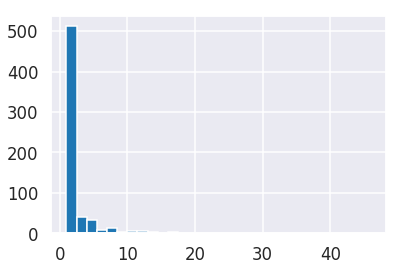

In [118]:
plt.hist(w.values(),bins=30)

(array([4.553e+03, 1.080e+02, 2.900e+01, 2.200e+01, 9.000e+00, 5.000e+00,
        5.000e+00, 2.000e+00, 3.000e+00, 1.000e+00, 1.000e+00, 0.000e+00,
        1.000e+00, 0.000e+00, 1.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([1.00000000e+00, 5.96666667e+01, 1.18333333e+02, 1.77000000e+02,
        2.35666667e+02, 2.94333333e+02, 3.53000000e+02, 4.11666667e+02,
        4.70333333e+02, 5.29000000e+02, 5.87666667e+02, 6.46333333e+02,
        7.05000000e+02, 7.63666667e+02, 8.22333333e+02, 8.81000000e+02,
        9.39666667e+02, 9.98333333e+02, 1.05700000e+03, 1.11566667e+03,
        1.17433333e+03, 1.23300000e+03, 1.29166667e+03, 1.35033333e+03,
        1.40900000e+03, 1.46766667e+03, 1.52633333e+03, 1.58500000e+03,
        1.64366667e+03, 1.70233333e+03, 1.76100000e+03]),
 <a list of 30 Patch objects>)

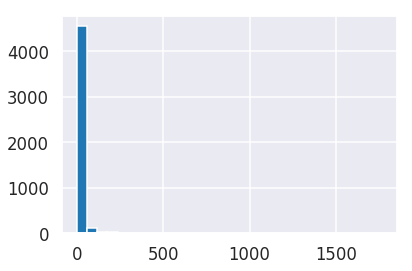

In [138]:
plt.hist(w.values(),bins=30)

#### Edges

In [130]:
importlib.reload(g)
H = dict()
P = dict()
phases = ['simulate']
for target in targets:
    H[target] = dict()
    P[target] = dict()
    for phase in phases:
        print('Calculating sparsity metric for {} {}'.format(target, phase))
        h,p = g.get_sparsity_over_edges(data=dfra, target=target, phase=phase, metric='gini')
        H[target][phase] = h
        P[target][phase] = p
        clear_output(wait=True)
print('Done!')

Done!


In [131]:
H2 = pd.DataFrame(H).transpose().reset_index()
importlib.reload(g)
print('-------')
print('**Mean Gini coefficient for edge traversals in each phase**')
## bootstrapped CIs on Gini coefficient for edge traversals in each phase
for phase in phases:
    print('{}'.format(phase))
    U,lb,ub,p1,p2 = g.bootstrapCI(H2[phase].values, verbose=True, compareNull=False)

-------
**Mean Gini coefficient for edge traversals in each phase**
simulate
Original mean = 0.64176. Bootstrapped mean = 0.64356.
95% CI = [0.57517, 0.71664].


In [135]:
H2

,index,simulate
0,hand_selected_004,0.495755
1,hand_selected_005,0.672726
2,hand_selected_006,0.754220
3,hand_selected_008,0.610722
4,hand_selected_009,0.497488
5,hand_selected_011,0.595841
6,hand_selected_012,0.800189
7,hand_selected_016,0.707172


In [8]:
import glob
import re

in_path = os.path.join(csv_dir,'agent_results/')

all_files = glob.glob(in_path + "/*250_thread_*.csv")
len([print(file) for file in all_files])
li = []

for filename in all_files:
    batch = pd.read_csv(filename, index_col=None, header=0)
    li.append(batch)

dfra = pd.concat(li, axis=0, ignore_index=True)

dfra['phase_extended'] = 'simulate'
dfra['gameID'] = dfra.runID

targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())


dfra['discreteWorld'] = dfra['discreteWorld'].apply(lambda a: np.array(ast.literal_eval(re.sub("\s+", ",", a.strip()))))
dfra['flatDiscreteWorld'] = dfra['discreteWorld'].apply(lambda a: a.flatten())

dfra['flatDiscreteWorldStr'] = dfra['flatDiscreteWorld'].apply(g.convert_to_str)

max_actions = dfra['blockNum'].max()

/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_25_thread_3.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_25_thread_0.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_25_thread_1.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_25_thread_2.csv


In [47]:
# sample 105 and create figures

phase_alias = 'random agent'

dfra['phase_extended'] = phase_alias

sample_size = 105
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = [phase_alias]
    for target in [targets[0]]:
        target_ids = dfra[(dfra.targetName==target) & (dfra.blockNum==0)]['runID']
        sample_ids = list(target_ids.sample(sample_size))
        sample = dfra[(dfra.targetName==target) & (dfra.runID.isin(sample_ids))]
        for this_phase in phases:
            g.plot_trajectory_graph(data = sample, 
                                    target_name = target, 
                                    phase = this_phase, 
                                    save = True, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.4,
                                    node_size_scale_factor = 0.4,
                                    colors = ["#1c373e","#1c373e"])

../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/Users/will/anaconda3/lib/python3.7/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



In [9]:
importlib.reload(g) ## reimport graph utils
make_plot = True
if make_plot:
    phases = ['simulation']
    for this_target in targets:
        for this_phase in phases:
            g.plot_trajectory_graph(data = dfra, 
                                    target_name = this_target, 
                                    phase = this_phase, 
                                    save = False, 
                                    out_dir = plot_dir,
                                    extension = 'test',
                                    x_lower_bound = 4,
                                    x_upper_bound = 13,
                                    edge_width_scale_factor = 0.4,
                                    node_size_scale_factor = 0.4)

../utils/scoring.py:16: RuntimeWarning:

invalid value encountered in long_scalars

/home/wmccarth/anaconda3/envs/py35/lib/python3.5/site-packages/scipy/ndimage/measurements.py:1359: RuntimeWarning:

invalid value encountered in double_scalars



## ngram analysis of world states

In [12]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to /home/wmccarth/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
# Distributions of Gini coefficients for ngrams

In [ ]:
def add_ngrams_to_dict(world_states, n, counts):
    n_grams = ngrams(world_states, n)
    for grams in n_grams:
        counts[' '.join(grams)] = counts.get(' '.join(grams), 0) + 1


In [100]:
import glob
import re

in_path = os.path.join(csv_dir,'agent_results/')

all_files = glob.glob(in_path + "/*250_thread_*.csv")
len([print(file) for file in all_files])
li = []

for filename in all_files:
    batch = pd.read_csv(filename, index_col=None, header=0)
    li.append(batch)

dfra = pd.concat(li, axis=0, ignore_index=True)

dfra['phase_extended'] = 'simulate'
dfra['gameID'] = dfra.runID

targets = np.sort(df['targetName'].unique())
ppts = np.sort(df['gameID'].unique())
reps = np.sort(df['repetition'].unique())


dfra['discreteWorld'] = dfra['discreteWorld'].apply(lambda a: np.array(ast.literal_eval(re.sub("\s+", ",", a.strip()))))
dfra['flatDiscreteWorld'] = dfra['discreteWorld'].apply(lambda a: a.flatten())
dfra['flatDiscreteWorldStr'] = dfra['flatDiscreteWorld'].apply(g.convert_to_str)

max_actions = dfra['blockNum'].max()


/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_14.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_7.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_8.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_5.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_9.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_13.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_3.csv
/home/wmccarth/block_construction/analysis/results/csv/agent_results/block_silhouette_initial_random_agent_250_thread_6.csv
/home/

AttributeError: 'FacetGrid' object has no attribute 'convert_to_str'

In [106]:
dfra['flatDiscreteWorldStr'] = dfra['flatDiscreteWorld'].apply(g.convert_to_str)

In [379]:
niter = 100
nppts = 105

results = pd.DataFrame(columns=['targetName','iter','gini'])

G = {}
for target in targets:
    G[target] = {}
    subset = dfra[(dfra.targetName==target) & (dfra.blockNum==0)]['runID']
    for i in range(niter):
        G[target][i] = {}
        sample_ids = list(subset.sample(nppts))
        sample = dfra[(dfra.targetName==target) & (dfra.runID.isin(sample_ids))]
        for n in range(1,11):
            counts = {}
            sample.groupby(['runID'])['flatDiscreteWorldStr']\
                        .agg(lambda ws: add_ngrams_to_dict(list(ws),n,counts))
            visits = list(counts.values())
            G[target][i][n] = gini_coefficient(visits)

            
for target in targets:
    target_df = pd.DataFrame.from_dict(G[target],orient='index')
    target_df.columns = target_df.columns.map(lambda x: 'gini'+str(x))
    target_df['iter'] = target_df.index
    target_df = pd.wide_to_long(target_df, stubnames='gini', i=['iter'], j='nlevel')
    target_df['targetName'] = target
    target_df = target_df.reset_index()
    results = results.append(target_df,sort=False)


In [380]:
# import seaborn as sns
# f = sns.FacetGrid(results, col="targetName", row="nlevel")
# f = (f.map(plt.hist, "gini")
#       .add_legend())

In [381]:
# human results

results_h = pd.DataFrame(columns=['targetName','phase','gini'])

G = {}
for target in targets:
    G[target] = {}
    for phase in ['pre','post']:
        G[target][phase] = {}
        df_phase = dfic[(dfic.targetName==target) & (dfic.phase_extended==phase)]
        for n in range(1,11):
            counts = {}
            df_phase.groupby(['gameID'])['flatDiscreteWorldStr']\
                        .agg(lambda ws: add_ngrams_to_dict(list(ws),n,counts))
            visits = list(counts.values())
            G[target][phase][n] = gini_coefficient(visits)

#     target_df = pd.DataFrame.from_dict(G[target])
#     target_df['n'] = target_df.index
#     target_df = target_df.melt()\
#                         .rename(columns={'variable':'iter','value':'gini'})
    
#     target_df['targetName'] = target
#     results = results.append(this,sort=False)
            
for target in targets:
    target_df = pd.DataFrame.from_dict(G[target],orient='index')
    target_df.columns = target_df.columns.map(lambda x: 'gini'+str(x))
    target_df['phase'] = target_df.index
    target_df = pd.wide_to_long(target_df, stubnames='gini', i=['phase'], j='nlevel')
    target_df['targetName'] = target
    target_df = target_df.reset_index()
    results_h = results_h.append(target_df,sort=False)

In [382]:
results_h['human'] = True
results['human'] = False

In [384]:
assert len(results_h[results_h.targetName=='hand_selected_004'])==20
assert len(results[results.targetName=='hand_selected_004'])==niter*10

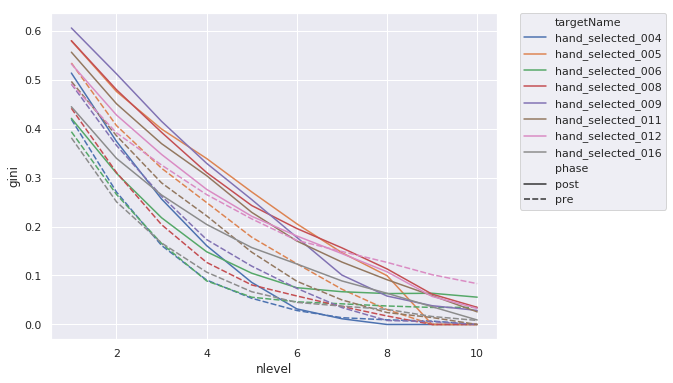

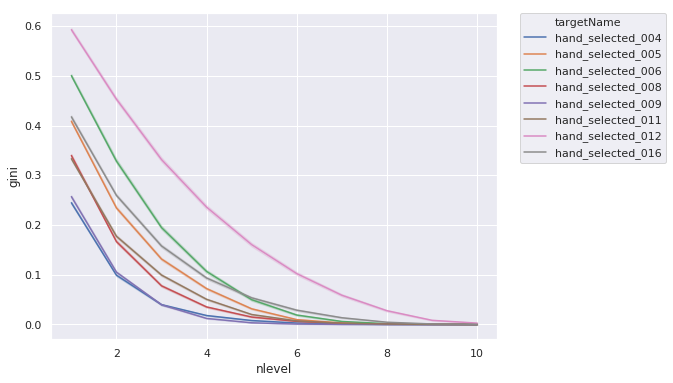

In [385]:
sns.set(rc={'figure.figsize':(8,6)})
plt.figure()
sns.lineplot(data=results_h, x='nlevel', y='gini', style='phase', hue='targetName')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

sns.set(rc={'figure.figsize':(8,6)})
plt.figure()
sns.lineplot(data=results, x='nlevel', y='gini', hue='targetName')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
sns.set(rc={'figure.figsize':(10,10)})


### comparison

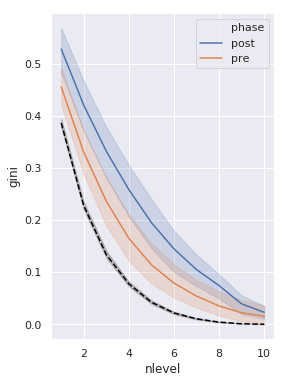

In [386]:
sns.set(rc={'figure.figsize':(4,6)})
ax1 = sns.lineplot(data=results, x='nlevel', y='gini', color='black', dashes=[(2, 2),(2,2)])
ax2 = sns.lineplot(data=results_h, x='nlevel', y='gini', hue='phase')
ax2.lines[0].set_linestyle("--")


In [387]:
both_results = results.append(results_h, sort=False)

In [52]:
out_path = os.path.join(csv_dir,'block_silhouette_{}_ngram_gini.csv'.format(iteration_name))
#both_results.to_csv(out_path)

In [53]:
pd.read_csv(out_path)

,Unnamed: 0,targetName,iter,gini,nlevel,human,phase
0,0,hand_selected_004,0.0,0.266711,1.0,False,NaN
1,1,hand_selected_004,1.0,0.236174,1.0,False,NaN
2,2,hand_selected_004,2.0,0.239911,1.0,False,NaN
3,3,hand_selected_004,3.0,0.244134,1.0,False,NaN
4,4,hand_selected_004,4.0,0.245821,1.0,False,NaN
...,...,...,...,...,...,...,...
8155,15,hand_selected_016,NaN,0.030856,8.0,True,pre
8156,16,hand_selected_016,NaN,0.036274,9.0,True,post
8157,17,hand_selected_016,NaN,0.016295,9.0,True,pre
8158,18,hand_selected_016,NaN,0.009215,10.0,True,post
